#Building Footprint Extraction for the USA

GeoAI (Geospatial Artificial Intelligence) refers to the integration of artificial intelligence (AI), machine learning (ML), and deep learning (DL) with geospatial data and technologies such as GIS (Geographic Information Systems), remote sensing, GPS, and spatial databases. It combines the spatial analysis capabilities of geoinformatics with the predictive and pattern-recognition power of AI to solve complex location-based problems.

Source: https://opengeoai.org/

In [1]:
%pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 551.2 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 186.1/186.1 kB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.0/93.0 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 574.4/574.4 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 45.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 48.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 32.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/2

#Import libraries

In [2]:
import geoai

#Download sample data

In [3]:
raster_url = (
    "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train.tif"
)
vector_url = "https://huggingface.co/datasets/giswqs/geospatial/resolve/main/naip_train_buildings.geojson"

In [4]:
raster_path = geoai.download_file(raster_url)

In [5]:
vector_path = geoai.download_file(vector_url)

#Visualize the Raster and Vector data

Raster CRS: EPSG:26911
Vector CRS: EPSG:4326
Reprojected vector to match raster CRS.


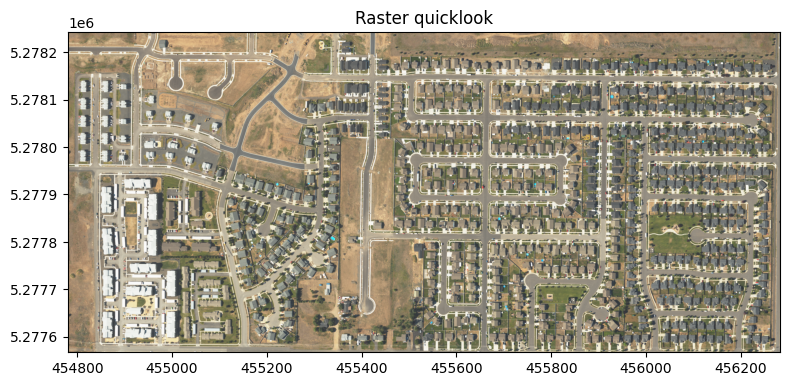

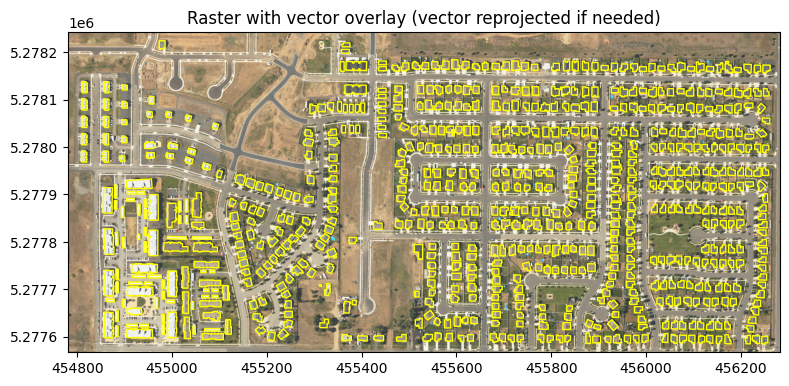

Raster bounds (in raster CRS): BoundingBox(left=454780.8, bottom=5277567.0, right=456282.6, top=5278242.6)
Vector bounds (in raster CRS): [ 454808.89420761 5277584.62805629  456261.91170834 5278224.23867822]


In [6]:
# ---- GeoAI raster + vector quick visualization & CRS check ----
# Assumes you already have:
#   raster_path = geoai.download_file(raster_url)
#   vector_path = geoai.download_file(vector_url)

import rasterio
from rasterio.plot import show
import geopandas as gpd
import matplotlib.pyplot as plt

# 1) Read data
src = rasterio.open(raster_path)
gdf = gpd.read_file(vector_path)

# 2) Inspect CRS
raster_crs = src.crs
vector_crs = gdf.crs

print("Raster CRS:", raster_crs)       # e.g., EPSG:32633
print("Vector CRS:", vector_crs)       # e.g., EPSG:4326 (lat/lon)

# 3) Reproject vector to raster CRS (if different)
if vector_crs is None:
    raise ValueError("Vector file has no CRS defined. Define it before reprojection (e.g., gdf.set_crs('EPSG:4326', inplace=True)).")

if raster_crs is None:
    raise ValueError("Raster file has no CRS defined. Define it first (e.g., in metadata) before overlaying.")

if vector_crs != raster_crs:
    gdf_plot = gdf.to_crs(raster_crs)
    print("Reprojected vector to match raster CRS.")
else:
    gdf_plot = gdf

# 4) Plot: raster alone
fig1, ax1 = plt.subplots(figsize=(8, 6))
show(src, ax=ax1)  # auto handles single/multiband quicklook
ax1.set_title("Raster quicklook")
plt.tight_layout()

# 5) Plot: raster + vector overlay
fig2, ax2 = plt.subplots(figsize=(8, 6))
show(src, ax=ax2)

# Style for vector overlay (tweak as needed)
if not gdf_plot.empty:
    # Choose default rendering by geometry type
    geom_types = set(gdf_plot.geom_type.str.lower())
    if {"polygon", "multipolygon"} & geom_types:
        gdf_plot.boundary.plot(ax=ax2, linewidth=1.0, edgecolor="yellow")
    else:
        gdf_plot.plot(ax=ax2, linewidth=1.0, color="yellow", markersize=5)

ax2.set_title("Raster with vector overlay (vector reprojected if needed)")
plt.tight_layout()
plt.show()

# 6) Optional: print spatial extents for sanity checks
r_bounds = src.bounds
print("Raster bounds (in raster CRS):", r_bounds)  # left, bottom, right, top
print("Vector bounds (in raster CRS):", gdf_plot.total_bounds)  # minx, miny, maxx, maxy


#Initialize building footprint extraction pretrained model
The model is inherits from a base ObjectDetector class and is designed to extract building footprints from imagery using a pre-trained Mask R-CNN model

In [9]:
extractor = geoai.BuildingFootprintExtractor()

Model path not specified, downloading from Hugging Face...
Model downloaded to: /root/.cache/huggingface/hub/models--giswqs--geoai/snapshots/6698907683cad47f1b85bf1ef4698ea086ba51a0/building_footprints_usa.pth
Model loaded successfully


#Extract building footprints
##Option 1: Extract building footprints as raster

In [10]:
mask_path = extractor.save_masks_as_geotiff(
    raster_path=raster_path,
    output_path="building_masks.tif",
    confidence_threshold=0.5,
    mask_threshold=0.5,
)

Processing masks with parameters:
- Confidence threshold: 0.5
- Chip size: (512, 512)
- Mask threshold: 0.5
Dataset initialized with 3 rows and 7 columns of chips
Image dimensions: 2503 x 1126 pixels
Chip size: 512 x 512 pixels
Overlap: 25.0% (stride_x=384, stride_y=384)
CRS: EPSG:26911
Processing raster with 6 batches


100%|██████████| 6/6 [02:49<00:00, 28.17s/it]

Object masks saved to building_masks.tif


##Convert raster to vector

In [11]:
gdf = extractor.masks_to_vector(
    mask_path=mask_path,
    output_path="building_masks.geojson",
    simplify_tolerance=1.0,
)

Converting mask to GeoJSON with parameters:
- Mask threshold: 0.5
- Min object area: 100
- Max object area: None
- Simplify tolerance: 1.0
- NMS IoU threshold: 0.5
- Regularize objects: True
- Angle threshold: 15° from 90°
- Rectangularity threshold: 70.0%
Mask dimensions: (1126, 2503)
Mask value range: 0 to 255
Found 696 potential objects


100%|██████████| 696/696 [00:02<00:00, 288.57it/s]


Created 664 valid polygons
Object count after NMS filtering: 664
Regularizing 664 objects...
- Angle threshold: 15° from 90°
- Min orthogonality: 30.0% of angles
- Min rectangularity: 70.0% of bounding box area


100%|██████████| 664/664 [00:00<00:00, 666.03it/s]


Regularization completed:
- Total objects: 664
- Rectangular objects: 660 (99.4%)
- Other regularized objects: 0 (0.0%)
- Unmodified objects: 4 (0.6%)
Saved 664 objects to building_masks.geojson


#Visualize building footprints

In [12]:
gdf.head()

,geometry,confidence,class,regularized
346,"POLYGON ((455712.594 5277854, 455732.406 52778...",1.0,1,rectangle
44,"POLYGON ((455362.562 5278113, 455410.188 52781...",1.0,1,rectangle
625,"POLYGON ((454902 5277597, 454957.188 5277597, ...",1.0,1,rectangle
303,"POLYGON ((454852.188 5277860, 454873.188 52778...",1.0,1,rectangle
312,"POLYGON ((454951.188 5277845, 454971 5277845, ...",1.0,1,rectangle


In [13]:
geoai.view_vector_interactive(
    gdf, column="confidence", layer_name="Building", tiles="Satellite"
)

In [14]:
geoai.view_vector_interactive(
    gdf, column="confidence", layer_name="Building", tiles=raster_url
)

Using confidence values (range: 0.21 - 1.00)
Visualization saved to naip_buildings.png
Sample visualization saved to naip_buildings_sample.png


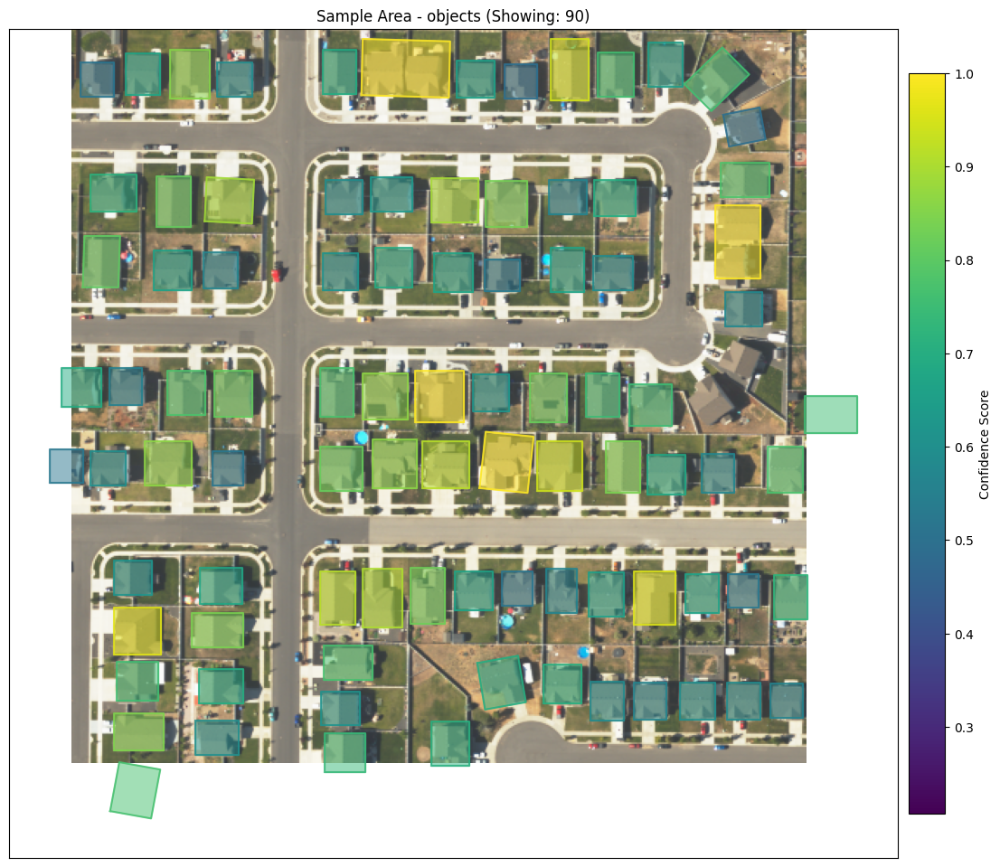

In [16]:
extractor.visualize_results(raster_path, gdf, output_path="naip_buildings.png")

#Option 2: Extract building footprints as vector

In [18]:
output_path = "naip_buildings.geojson"
gdf = extractor.process_raster(
    raster_path,
    output_path="buildings.geojson",
    batch_size=4,
    confidence_threshold=0.5,
    overlap=0.25,
    nms_iou_threshold=0.5,
    min_object_area=100,
    max_object_area=None,
    mask_threshold=0.5,
    simplify_tolerance=1.0,
)

Processing with parameters:
- Confidence threshold: 0.5
- Tile overlap: 0.25
- Chip size: (512, 512)
- NMS IoU threshold: 0.5
- Mask threshold: 0.5
- Min object area: 100
- Max object area: None
- Simplify tolerance: 1.0
- Filter edge objects: True
- Edge buffer size: 20 pixels
Dataset initialized with 3 rows and 7 columns of chips
Image dimensions: 2503 x 1126 pixels
Chip size: 512 x 512 pixels
Overlap: 25.0% (stride_x=384, stride_y=384)
CRS: EPSG:26911
Processing raster with 6 batches


100%|██████████| 6/6 [02:48<00:00, 28.15s/it]


Objects before filtering: 749
Objects after filtering: 749
Saved 749 objects to buildings.geojson


#Regularize building footprints

In [19]:
gdf_regularized = extractor.regularize_buildings(
    gdf=gdf,
    min_area=100,
    angle_threshold=15,
    orthogonality_threshold=0.3,
    rectangularity_threshold=0.7,
)

Regularizing 749 objects...
- Angle threshold: 15° from 90°
- Min orthogonality: 30.0% of angles
- Min rectangularity: 70.0% of bounding box area


100%|██████████| 749/749 [00:00<00:00, 848.80it/s]

Regularization completed:
- Total objects: 749
- Rectangular objects: 696 (92.9%)
- Other regularized objects: 0 (0.0%)
- Unmodified objects: 53 (7.1%)


#Visualize building footprints

In [20]:
gdf.head()

,geometry,confidence,class
548,"POLYGON ((455272.2 5277763.2, 455271 5277762, ...",0.999945,1
1234,"POLYGON ((455984.4 5277643.8, 455983.8 5277643...",0.999941,1
888,"POLYGON ((456074.4 5277719.4, 456073.2 5277718...",0.999941,1
549,"POLYGON ((455243.4 5277855, 455242.8 5277854.4...",0.999938,1
438,"POLYGON ((454989 5277799.2, 454988.4 5277798.6...",0.999931,1


In [21]:
geoai.view_vector_interactive(
    gdf, column="confidence", layer_name="Building", tiles="Satellite"
)

In [22]:
geoai.view_vector_interactive(
    gdf, column="confidence", layer_name="Building", tiles=raster_url
)

In [23]:
geoai.view_vector_interactive(
    gdf_regularized, column="confidence", layer_name="Building", tiles=raster_url
)

Using confidence values (range: 0.57 - 1.00)
Visualization saved to naip_buildings.png
Sample visualization saved to naip_buildings_sample.png


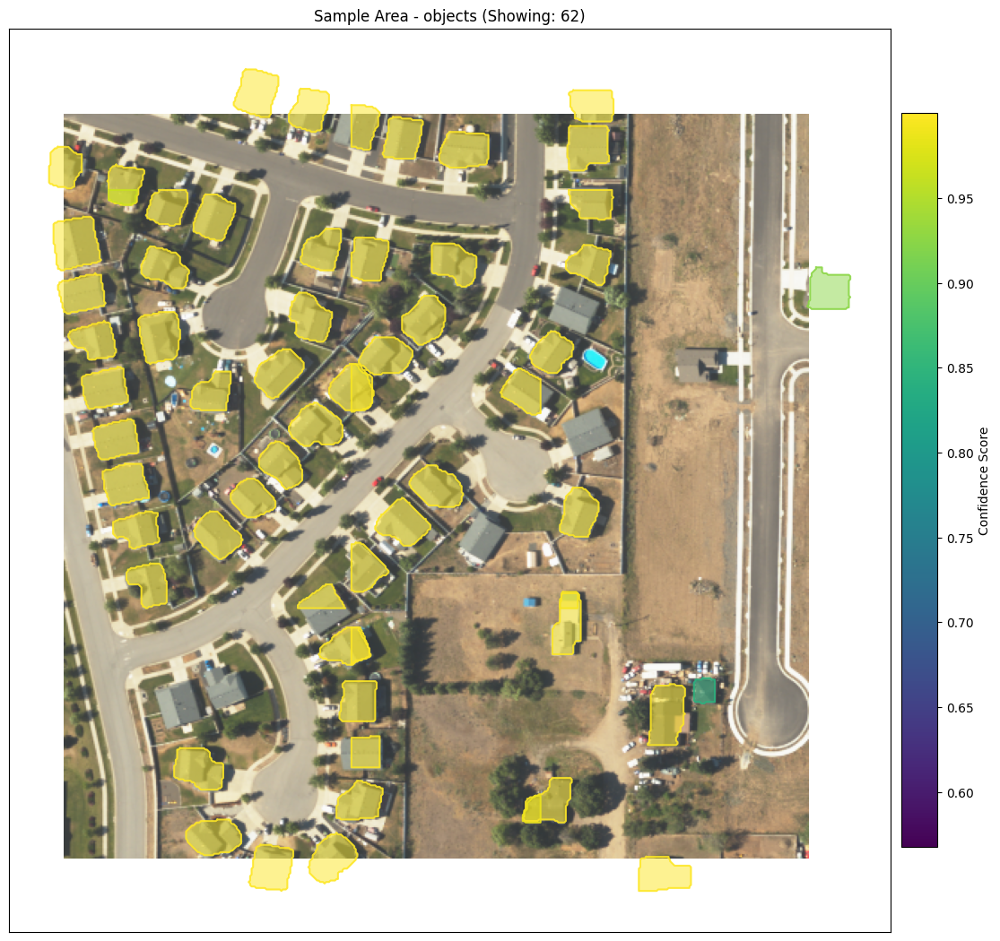

In [24]:
extractor.visualize_results(raster_path, gdf, output_path="naip_buildings.png")

Using confidence values (range: 0.57 - 1.00)
Visualization saved to naip_buildings_regularized.png
Sample visualization saved to naip_buildings_regularized_sample.png


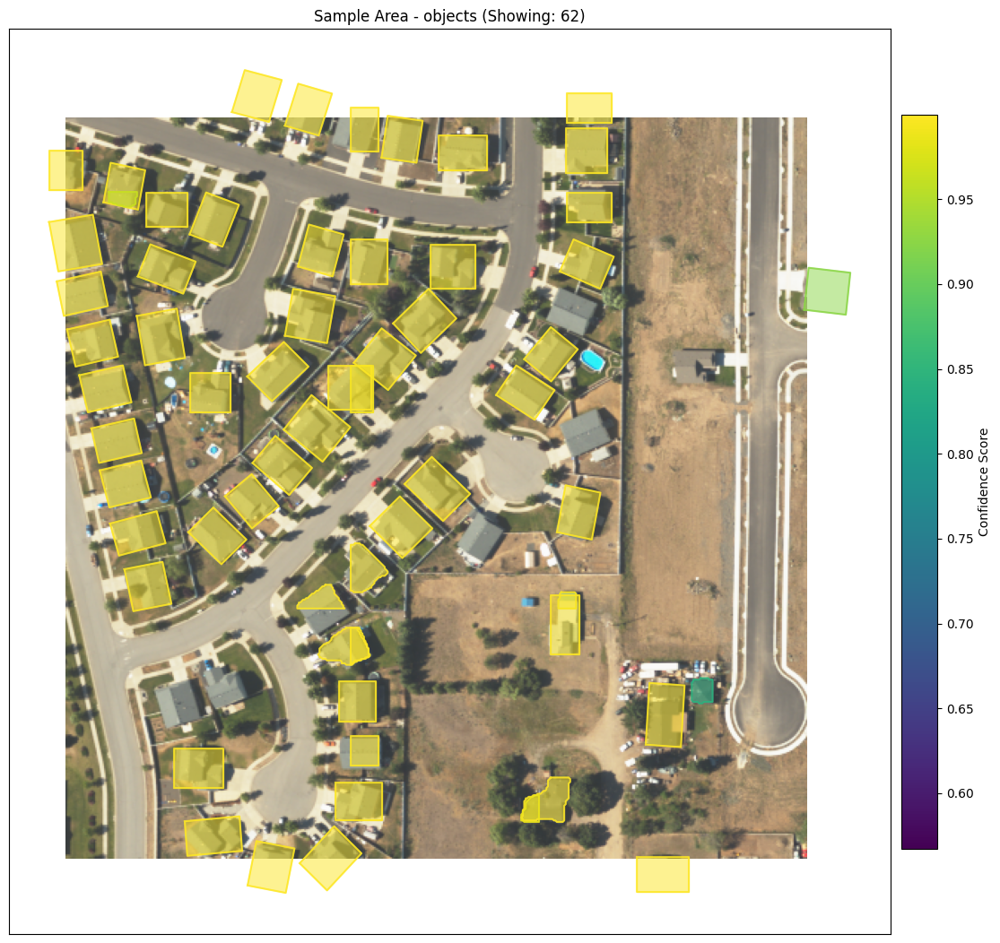

In [25]:
extractor.visualize_results(
    raster_path, gdf_regularized, output_path="naip_buildings_regularized.png"
)

#Comparing Raw and Regularized Building Footprints

This script visually compares raw building footprint extractions from geoai.BuildingFootprintExtractor with their regularized counterparts, highlighting what changed during the cleaning process.

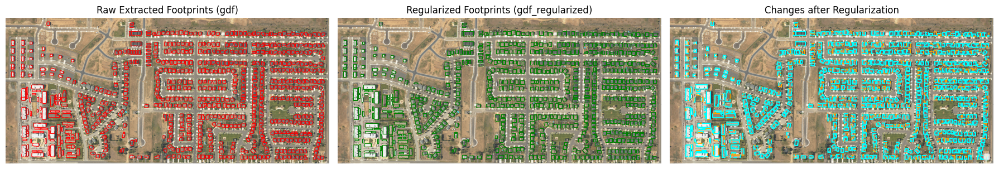

In [26]:
import matplotlib.pyplot as plt
import geopandas as gpd
import rasterio
from rasterio.plot import show

# --- Inputs assumed available ---
# raster_path  -> your raster file path
# gdf          -> raw extracted footprints
# gdf_regularized -> cleaned / regularized footprints

# 1) Open raster and harmonize CRS
with rasterio.open(raster_path) as src:
    r_crs = src.crs
    if gdf.crs != r_crs:
        gdf_plot = gdf.to_crs(r_crs)
    else:
        gdf_plot = gdf

    if gdf_regularized.crs != r_crs:
        gdf_reg_plot = gdf_regularized.to_crs(r_crs)
    else:
        gdf_reg_plot = gdf_regularized

    # 2) Compute differences (what changed?)
    #    removed_parts: present in raw but not in regularized
    #    added_parts:   present in regularized but not in raw
    # Note: overlay can be a bit slow on very large datasets.
    removed_parts = gpd.overlay(gdf_plot, gdf_reg_plot, how="difference", keep_geom_type=True)
    added_parts   = gpd.overlay(gdf_reg_plot, gdf_plot, how="difference", keep_geom_type=True)

    # 3) Plot: Raw | Regularized | Changes
    fig, axes = plt.subplots(1, 3, figsize=(18, 7))

    # --- Left: Raw ---
    show(src, ax=axes[0])
    if not gdf_plot.empty:
        gdf_plot.plot(ax=axes[0], facecolor="none", edgecolor="red", linewidth=0.8)
    axes[0].set_title("Raw Extracted Footprints (gdf)")
    axes[0].axis("off")

    # --- Middle: Regularized ---
    show(src, ax=axes[1])
    if not gdf_reg_plot.empty:
        gdf_reg_plot.plot(ax=axes[1], facecolor="none", edgecolor="green", linewidth=0.8)
    axes[1].set_title("Regularized Footprints (gdf_regularized)")
    axes[1].axis("off")

    # --- Right: What changed? (removed vs added) ---
    show(src, ax=axes[2])
    if not removed_parts.empty:
        removed_parts.plot(ax=axes[2], facecolor="none", edgecolor="orange", linewidth=1.0, label="Removed")
    if not added_parts.empty:
        added_parts.plot(ax=axes[2], facecolor="none", edgecolor="cyan", linewidth=1.0, label="Added")
    axes[2].set_title("Changes after Regularization")
    axes[2].legend(loc="lower right")
    axes[2].axis("off")

    plt.tight_layout()
    plt.show()
